<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#INTRODUCTIOIN" data-toc-modified-id="INTRODUCTIOIN-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>INTRODUCTIOIN</a></span></li><li><span><a href="#MAPS" data-toc-modified-id="MAPS-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>MAPS</a></span><ul class="toc-item"><li><span><a href="#Import-and-Clean-the-Dataset" data-toc-modified-id="Import-and-Clean-the-Dataset-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Import and Clean the Dataset</a></span></li><li><span><a href="#Descriptive-Analysis" data-toc-modified-id="Descriptive-Analysis-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Descriptive Analysis</a></span></li><li><span><a href="#K-means-Clustering" data-toc-modified-id="K-means-Clustering-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>K-means Clustering</a></span></li><li><span><a href="#Descriptive-Analysis-of-the-Four-Groups" data-toc-modified-id="Descriptive-Analysis-of-the-Four-Groups-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Descriptive Analysis of the Four Groups</a></span></li><li><span><a href="#Choropleth-Map-and-Locations-of-Schools" data-toc-modified-id="Choropleth-Map-and-Locations-of-Schools-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Choropleth Map and Locations of Schools</a></span><ul class="toc-item"><li><span><a href="#Import-and-clean-the-dataset" data-toc-modified-id="Import-and-clean-the-dataset-2.5.1"><span class="toc-item-num">2.5.1&nbsp;&nbsp;</span>Import and clean the dataset</a></span></li><li><span><a href="#Choropleth-map" data-toc-modified-id="Choropleth-map-2.5.2"><span class="toc-item-num">2.5.2&nbsp;&nbsp;</span>Choropleth map</a></span></li><li><span><a href="#Locations-of-the-schools-with-the-lowest-scores" data-toc-modified-id="Locations-of-the-schools-with-the-lowest-scores-2.5.3"><span class="toc-item-num">2.5.3&nbsp;&nbsp;</span>Locations of the schools with the lowest scores</a></span></li><li><span><a href="#Locations-of-the-schools-with-the-highest-scores" data-toc-modified-id="Locations-of-the-schools-with-the-highest-scores-2.5.4"><span class="toc-item-num">2.5.4&nbsp;&nbsp;</span>Locations of the schools with the highest scores</a></span></li></ul></li></ul></li></ul></div>

# INTRODUCTIOIN

In this Notebook, a possible relationship between education and crime was examined. Specifically, this study used crime data and educational scores of public elementary schools in Chicago to visualize if schools who had the lowest scores were located in areas that were exposed to higher risks of crime. 

First, k-means clustering was conducted by using scikit-learn. Public elementary schools were divided into 4 groups based on accademic scores. 

Second, a choropleth map was created by using Folium. The map shows color differences based on the numbers of incidents in each community area. Then, the locations of schools who were classified as "having the lowest academic scores" were plotted on the same map to see if these schools were located on areas that had higher risks of crime. 

Third, the locations of schools who were classified as "having the highest academic scores" were plotted on the same map to see if these schools were located on areas that had lower risks of crime. 


The educational dataset was obtained from "Chicago Public Schools - Progress Report Cards (2011-2012)": 

https://data.cityofchicago.org/Education/Chicago-Public-Schools-Progress-Report-Cards-2011-/9xs2-f89t?cm_mmc=Email_Newsletter-_-Developer_Ed%2BTech-_-WW_WW-_-SkillsNetwork-Courses-IBMDeveloperSkillsNetwork-DB0201EN-SkillsNetwork-20127838&cm_mmca1=000026UJ&cm_mmca2=10006555&cm_mmca3=M12345678&cvosrc=email.Newsletter.M12345678&cvo_campaign=000026UJ


The crime dataset was from 2012, and was obtained from Chicago Data Portal: 

https://data.cityofchicago.org/Public-Safety/Crimes-2001-to-Present/ijzp-q8t2



NOTE: maps rendered by Folium cannot be displayed on Github. Therefore, images of each map were put on this Notebook. Please go to "nbviewer" (https://nbviewer.jupyter.org/) and enter this notebook's URL to see the maps

# MAPS

## Import and Clean the Dataset

In [42]:
import pandas as pd
import numpy as np

In [43]:
# Set an option to display all the columns

pd.set_option('display.max_columns', 80)

In [44]:
df = pd.read_csv('ChicagoSchool.csv')

df.head()

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,State,ZIP Code,Phone Number,Link,Network Manager,Collaborative Name,Adequate Yearly Progress Made?,Track Schedule,CPS Performance Policy Status,CPS Performance Policy Level,Healthy Schools Certified?,Safety Icon,Safety Score,Family Involvement Icon,Family Involvement Score,Environment Icon,Environment Score,Instruction Icon,Instruction Score,Leaders Icon,Leaders Score,Teachers Icon,Teachers Score,Parent Engagement Icon,Parent Engagement Score,Parent Environment Icon,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Average Teacher Attendance,Individualized Education Program Compliance Rate,Pk-2 Literacy %,Pk-2 Math %,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Read %,Gr3-5 Keep Pace Math %,Gr6-8 Grade Level Math %,Gr6-8 Grade Level Read %,Gr6-8 Keep Pace Math%,Gr6-8 Keep Pace Read %,Gr-8 Explore Math %,Gr-8 Explore Read %,ISAT Exceeding Math %,ISAT Exceeding Reading %,ISAT Value Add Math,ISAT Value Add Read,ISAT Value Add Color Math,ISAT Value Add Color Read,Students Taking Algebra %,Students Passing Algebra %,9th Grade EXPLORE (2009),9th Grade EXPLORE (2010),10th Grade PLAN (2009),10th Grade PLAN (2010),Net Change EXPLORE and PLAN,11th Grade Average ACT (2011),Net Change PLAN and ACT,College Eligibility %,Graduation Rate %,College Enrollment Rate %,College Enrollment (number of students),General Services Route,Freshman on Track Rate %,RCDTS Code,X_COORDINATE,Y_COORDINATE,Latitude,Longitude,Community Area Number,Community Area Name,Ward,Police District,Location
0,609966,Charles G Hammond Elementary School,ES,2819 W 21st Pl,Chicago,IL,60623,(773) 535-4580,http://schoolreports.cps.edu/SchoolProgressRep...,Pilsen-Little Village Elementary Network,WEST SIDE COLLABORATIVE,No,Track_E,Not on Probation,Level 2,No,Average,40.0,NDA,NDA,Average,41.0,Average,43.0,NDA,NDA,NDA,NDA,Weak,43,Weak,45,95.3,8.5,95.2,92.0,77.4,NDA,27.4,24.8,62.4,53.7,38.1,28.8,60.2,59.8,12.8,5.3,10.1,5.8,0.5,0.2,Yellow,Yellow,25,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,446,39,NDA,150000000000000,1157809.015,1889554.623,41.852691,-87.696278,30,SOUTH LAWNDALE,12,10,"(41.85269133, -87.69627777)"
1,610539,Marvin Camras Elementary School,ES,3000 N Mango Ave,Chicago,IL,60634,(773) 534-2960,http://schoolreports.cps.edu/SchoolProgressRep...,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Standard,Not on Probation,Not Enough Data,No,Average,54.0,Average,58,Weak,37.0,Average,41.0,Very Strong,83,Very Strong,88,Average,51,Strong,55,95.1,4.3,0.0,97.7,47.5,39.9,30.8,27.8,47.8,38.6,41.1,38.5,49.2,55.4,15.3,30.5,11.2,12.0,-1.8,-0.3,Red,Yellow,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,826,30,NDA,150000000000000,1137482.296,1919394.900,41.934966,-87.770165,19,BELMONT CRAGIN,30,25,"(41.93496641, -87.77016525)"
2,609852,Eliza Chappell Elementary School,ES,2135 W Foster Ave,Chicago,IL,60625,(773) 534-2390,http://schoolreports.cps.edu/SchoolProgressRep...,Ravenswood-Ridge Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,Yes,Standard,Not on Probation,Level 1,No,Strong,70.0,Strong,65,Average,53.0,Average,51.0,Average,56,Average,48,Average,50,Average,52,95.1,2.9,96.7,98.9,72.6,57,56,54.4,55.2,69,53.2,63.9,60,59.8,12.8,41,19.6,17.6,0.4,1.0,Yellow,Green,27.5,63.6,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,451,31,NDA,150000000000000,1161016.902,1934466.545,41.975867,-87.683254,4,LINCOLN SQUARE,47,20,"(41.975867, -87.68325438)"
3,609835,Daniel R Cameron Elementary School,ES,1234 N Monticello Ave,Chicago,IL,60651,(773) 534-4290,http://schoolreports.cps.edu/SchoolProgressRep...,Garfield-Humboldt Elementary Network,WEST SIDE COLLABORATIVE,No,Track_E,Probation,Level 3,No,Average,42.0,NDA,NDA,Average,49.0,Average,50.0,NDA,NDA,NDA,NDA,Weak,46,Weak,46,92.6,153.9,96.2,98.4,47.8,21.1,16.4,16.1,31.3,34.7,19.2,15.6,33.5,35,9.2,7.1,10.3,5.9,-1.0,-1.4,Red,Red,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,828,34,NDA,150000000000000

In [45]:
# Get elemtary school dataset

df_es = df[df['Elementary, Middle, or High School'] == 'ES'].reset_index(drop=True)

df_es.shape

(462, 79)

In [46]:
# There are 462 elementary schools in Chicago
# Choose variables that indicate elementary school students' academic scores 

df_es = df_es[['Name of School','Gr3-5 Grade Level Math %', 'Gr3-5 Grade Level Read % ',  'Gr3-5 Keep Pace Math %', 'Gr3-5 Keep Pace Read %',  'Latitude', 'Longitude']]

df_es.head()

,Name of School,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Math %,Gr3-5 Keep Pace Read %,Latitude,Longitude
0,Charles G Hammond Elementary School,27.4,24.8,53.7,62.4,41.852691,-87.696278
1,Marvin Camras Elementary School,30.8,27.8,38.6,47.8,41.934966,-87.770165
2,Eliza Chappell Elementary School,56,54.4,69,55.2,41.975867,-87.683254
3,Daniel R Cameron Elementary School,16.4,16.1,34.7,31.3,41.903785,-87.717963
4,Sir Miles Davis Magnet Elementary Academy,24.8,14.1,52,43.1,41.771222,-87.666567


In [47]:
# Replace missing values (NDA) with NaN

df_es = df_es.replace('NDA',np.nan, regex=True)
df_es.head()

,Name of School,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Math %,Gr3-5 Keep Pace Read %,Latitude,Longitude
0,Charles G Hammond Elementary School,27.4,24.8,53.7,62.4,41.852691,-87.696278
1,Marvin Camras Elementary School,30.8,27.8,38.6,47.8,41.934966,-87.770165
2,Eliza Chappell Elementary School,56,54.4,69,55.2,41.975867,-87.683254
3,Daniel R Cameron Elementary School,16.4,16.1,34.7,31.3,41.903785,-87.717963
4,Sir Miles Davis Magnet Elementary Academy,24.8,14.1,52,43.1,41.771222,-87.666567


In [48]:
# Check the number of missing values

df_es.isnull().sum()

Name of School                0
Gr3-5 Grade Level Math %     11
Gr3-5 Grade Level Read %     11
Gr3-5 Keep Pace Math %       11
Gr3-5 Keep Pace Read %       11
Latitude                      0
Longitude                     0
dtype: int64

In [49]:
# Delete schools that do not have complete values

df_es=df_es.dropna()
df_es.shape

(451, 7)

In [50]:
# Chceck datatypes of the df

df_es.dtypes

Name of School                object
Gr3-5 Grade Level Math %      object
Gr3-5 Grade Level Read %      object
Gr3-5 Keep Pace Math %        object
Gr3-5 Keep Pace Read %        object
Latitude                     float64
Longitude                    float64
dtype: object

In [51]:
# Change the data types of the academic scores' columns to float 

df_es = df_es.astype({"Gr3-5 Grade Level Math %": float, "Gr3-5 Grade Level Read % ": float, "Gr3-5 Keep Pace Math %": float, "Gr3-5 Keep Pace Read %": float})

df_es.dtypes

Name of School                object
Gr3-5 Grade Level Math %     float64
Gr3-5 Grade Level Read %     float64
Gr3-5 Keep Pace Math %       float64
Gr3-5 Keep Pace Read %       float64
Latitude                     float64
Longitude                    float64
dtype: object

In [52]:
# Conduct statistical analysis and machine learning, so 'Name of School', 'Latitude', 'Longitude' will be dropped 

df_es_stat=df_es.drop(['Name of School', 'Latitude', 'Longitude'], axis=1)

df_es_stat.head()

,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Math %,Gr3-5 Keep Pace Read %
0,27.4,24.8,53.7,62.4
1,30.8,27.8,38.6,47.8
2,56.0,54.4,69.0,55.2
3,16.4,16.1,34.7,31.3
4,24.8,14.1,52.0,43.1


## Descriptive Analysis

In [53]:
# Descriptive analysis

df_es_stat.describe().round(2)

,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Math %,Gr3-5 Keep Pace Read %
count,451.00,451.00,451.00,451.00
mean,37.92,33.34,56.12,51.77
std,18.97,19.30,12.02,9.85
min,0.00,0.00,12.80,27.30
25%,23.65,18.95,48.20,44.90
50%,35.40,27.90,56.20,51.70
75%,47.70,42.55,63.90,57.90
max,100.00,100.00,83.50,82.50


## K-means Clustering 

In [57]:
# Noralize the dataset
from sklearn.preprocessing import StandardScaler

X = df_es_stat.values
cluster_dataset = StandardScaler().fit_transform(X)
X

array([[27.4, 24.8, 53.7, 62.4],
       [30.8, 27.8, 38.6, 47.8],
       [56. , 54.4, 69. , 55.2],
       ...,
       [46.1, 59.9, 73.1, 61.7],
       [33.3, 19.2, 72.9, 48.9],
       [35.7, 22.6, 61.1, 48.4]])

In [58]:
# Run K-means clustering and divide the schools into 4 groups 

from sklearn.cluster import KMeans 

num_clusters = 4

k_means = KMeans(init="k-means++", n_clusters=num_clusters, n_init=12)
k_means.fit(cluster_dataset)
labels = k_means.labels_

print(labels)

[3 3 0 1 3 0 2 1 1 1 2 3 0 0 3 3 0 3 3 3 3 2 3 3 0 1 2 0 0 3 0 3 3 1 0 0 0
 2 3 3 3 0 1 1 2 0 1 0 2 3 0 0 3 1 3 3 2 1 0 0 1 3 0 0 0 3 0 1 3 3 2 1 0 2
 1 1 0 1 1 1 0 0 0 2 0 2 3 0 3 0 1 3 1 0 3 3 3 0 1 3 3 3 1 3 1 3 3 1 3 0 3
 3 3 0 3 1 2 0 0 1 0 3 1 1 0 0 3 3 1 3 1 3 3 3 1 0 0 0 0 3 2 3 2 3 1 0 3 0
 0 3 0 1 2 0 2 0 0 1 0 0 3 2 0 3 3 3 1 0 3 1 3 3 3 3 2 2 3 0 3 1 1 1 3 0 2
 3 2 3 3 2 0 3 3 1 3 3 2 1 0 3 1 0 0 0 3 1 1 1 0 3 3 0 3 1 1 0 3 2 0 0 2 3
 3 2 2 1 0 0 0 2 1 3 1 3 0 3 1 2 1 2 2 3 0 3 0 3 3 2 0 3 1 3 3 2 1 2 3 3 2
 2 0 2 0 1 0 2 2 0 2 2 0 0 1 2 1 3 3 1 3 3 0 3 3 3 3 3 0 0 1 1 0 3 2 0 0 0
 1 3 2 3 2 1 3 1 1 1 1 3 0 3 3 0 0 3 2 1 2 3 0 1 3 1 0 3 0 3 0 3 3 3 0 2 3
 0 3 0 0 3 3 0 3 1 0 3 3 3 3 2 1 1 3 3 0 2 0 3 3 3 1 3 0 3 0 3 0 1 2 0 0 2
 3 0 3 0 0 1 2 1 3 2 3 2 2 2 0 0 3 3 1 3 0 0 0 3 1 3 0 2 3 0 3 3 2 0 1 2 0
 3 2 2 0 3 3 2 2 2 2 3 0 3 3 3 0 1 3 3 1 3 1 3 0 3 3 0 2 0 0 3 3 3 3 3 3 0
 0 0 1 0 0 0 3]


In [59]:
# Include the group numbers to df_es_stat

df_es_stat["Labels"] = labels

df_es_stat.head()

,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Math %,Gr3-5 Keep Pace Read %,Labels
0,27.4,24.8,53.7,62.4,3
1,30.8,27.8,38.6,47.8,3
2,56.0,54.4,69.0,55.2,0
3,16.4,16.1,34.7,31.3,1
4,24.8,14.1,52.0,43.1,3


## Descriptive Analysis of the Four Groups

In [60]:
# Check how many schools were classified into 4 groups 

df_es_stat.groupby('Labels').count()

,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Math %,Gr3-5 Keep Pace Read %
Labels,,,,
0,132,132,132,132
1,84,84,84,84
2,68,68,68,68
3,167,167,167,167


In [61]:
# Check means of each group

df_es_stat.groupby('Labels').mean().round(2)

,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Math %,Gr3-5 Keep Pace Read %
Labels,,,,
0,43.27,35.89,65.73,57.43
1,17.11,15.46,40.09,39.33
2,71.25,69.76,65.98,62.11
3,30.59,25.48,52.57,49.35


Seems like Group 1 has the lowest means of all academic scores. 
Group 2 has the higest scores. 

In [62]:
# Add the colum "Labels" to df_es (df that has name of schools, latitude, and longitude)

df_es["Labels"] = labels

df_es.head()

,Name of School,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Math %,Gr3-5 Keep Pace Read %,Latitude,Longitude,Labels
0,Charles G Hammond Elementary School,27.4,24.8,53.7,62.4,41.852691,-87.696278,3
1,Marvin Camras Elementary School,30.8,27.8,38.6,47.8,41.934966,-87.770165,3
2,Eliza Chappell Elementary School,56.0,54.4,69.0,55.2,41.975867,-87.683254,0
3,Daniel R Cameron Elementary School,16.4,16.1,34.7,31.3,41.903785,-87.717963,1
4,Sir Miles Davis Magnet Elementary Academy,24.8,14.1,52.0,43.1,41.771222,-87.666567,3


In [81]:
# Select schools that were classified as Group 1 

df_es1=df_es[df_es['Labels']==1]
df_es1.head()

,Name of School,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Math %,Gr3-5 Keep Pace Read %,Latitude,Longitude,Labels
3,Daniel R Cameron Elementary School,16.4,16.1,34.7,31.3,41.903785,-87.717963,1
7,James N Thorp Elementary School,9.1,10.4,31.0,33.6,41.733310,-87.544515,1
8,Roswell B Mason Elementary School,8.1,20.3,31.2,34.2,41.856852,-87.730491,1
9,Ira F Aldridge Elementary School,20.7,20.2,40.9,46.7,41.657432,-87.606496,1
26,Granville T Woods Math & Science Academy Eleme...,25.8,11.4,53.8,35.1,41.781165,-87.654688,1


## Choropleth Map and Locations of Schools

### Import and clean the dataset

In [63]:
df_incidents = pd.read_csv('Crimes 2012.csv')

df_incidents.head()

,ID,Primary Type,Description,Arrest,Community Area,Latitude,Longitude
0,11645833,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,False,25.0,NaN,NaN
1,11227247,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,False,52.0,NaN,NaN
2,10225605,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,False,1.0,42.00167,-87.673864
3,11228588,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT $300 AND UNDER,False,70.0,NaN,NaN
4,10751224,OFFENSE INVOLVING CHILDREN,AGG CRIM SEX ABUSE FAM MEMBER,False,25.0,NaN,NaN


In [66]:
df_incidents.isnull().sum()

ID                  0
Primary Type        0
Description       369
Arrest              0
Community Area     26
Latitude          707
Longitude         707
dtype: int64

In [68]:
df_incidents.dropna(subset=["Latitude", "Longitude", "Community Area"], axis=0, inplace=True)
df_incidents.isnull().sum()

ID                  0
Primary Type        0
Description       369
Arrest              0
Community Area      0
Latitude            0
Longitude           0
dtype: int64

In [69]:
df_incidents.shape

(335424, 7)

In [71]:
# Choose incidents where arrests were made

df_arrest = df_incidents.query('Arrest == True')
df_arrest.reset_index(inplace=True)

df_arrest.shape

(90555, 8)

In [89]:
# Since the size of the original dataset is too big for this analysis, the number of incidents will be limited to 1000

limit = 1000
df_arrest_1000 = df_arrest.iloc[0:limit, :]
df_arrest_1000.shape

(1000, 8)

In [90]:
df_arrest_counts_com = pd.DataFrame(df_arrest_1000['Community Area'].value_counts())

df_arrest_counts_com

,Community Area
25.0,119
23.0,50
8.0,45
61.0,39
29.0,36
...,...
18.0,1
7.0,1
47.0,1
55.0,1


In [91]:
# Reset the index and change the name of columns

df_arrest_counts_com= df_arrest_counts_com.reset_index()

df_arrest_counts_com.columns = ['Community area','Number of Incidents']

df_arrest_counts_com

,Community area,Number of Incidents
0,25.0,119
1,23.0,50
2,8.0,45
3,61.0,39
4,29.0,36
...,...,...
68,18.0,1
69,7.0,1
70,47.0,1
71,55.0,1


In [92]:
# Check the data types

df_arrest_counts_com.dtypes

Community area         float64
Number of Incidents      int64
dtype: object

In [93]:
# Change the data types to create a choropleth map

df_arrest_counts_com['Community area'] = df_arrest_counts_com['Community area'].astype('int').astype('str')
df_arrest_counts_com.dtypes

Community area         object
Number of Incidents     int64
dtype: object

### Choropleth map

In [77]:
!conda install -c conda-forge folium=0.5.0 --yes
import folium

Solving environment: ...working... done

# All requested packages already installed.



In [78]:
chicago_geo = r'Chicago.geojson'

In [79]:
# generate choropleth map

latitude = 41.8781
longitude = -87.6298

# create a numpy array of length 6 and has linear spacing from the minium total incidents to the maximum total incidents
threshold_scale = np.linspace(df_arrest_counts_com['Number of Incidents'].min(),
                              df_arrest_counts_com['Number of Incidents'].max(),
                              6, dtype=int)

threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum total incidents
                                              # [-1] indicates the last value of the list
    
chicago_mapch=folium.Map(location=[latitude, longitude], zoom_start=12)

chicago_mapch.choropleth(
    geo_data=chicago_geo,
    name="choropleth",
    data=df_arrest_counts_com,
    columns=['Community area', 'Number of Incidents'],
    key_on='feature.properties.area_num_1',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Incidents'
)


# display map
chicago_mapch

Image of the map

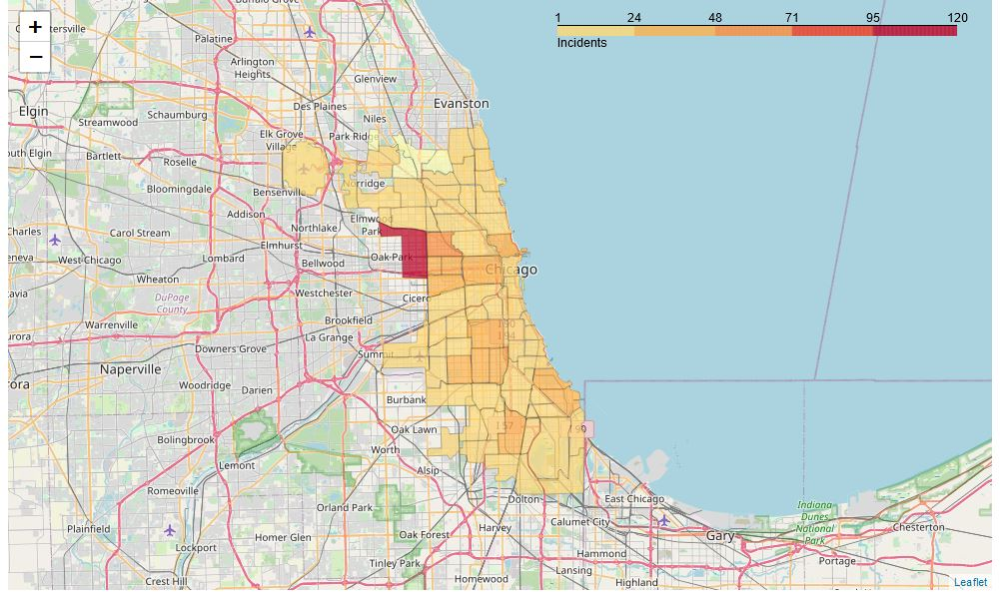

### Locations of the schools with the lowest scores

In [94]:
for lat, lng, name in zip(df_es1['Latitude'], df_es1['Longitude'], df_es1['Name of School']):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(chicago_mapch)  
    
chicago_mapch

Images of the map

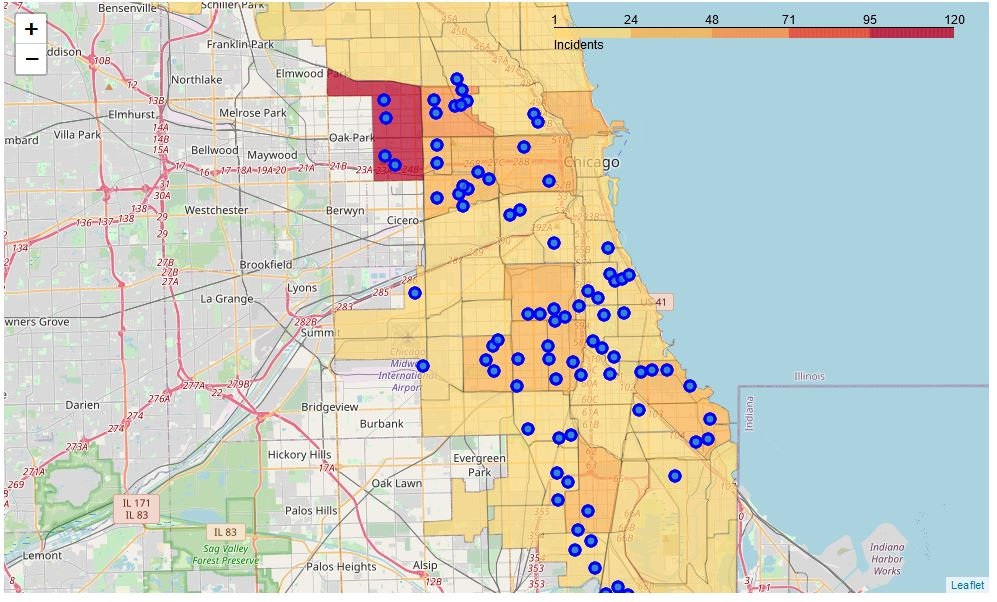

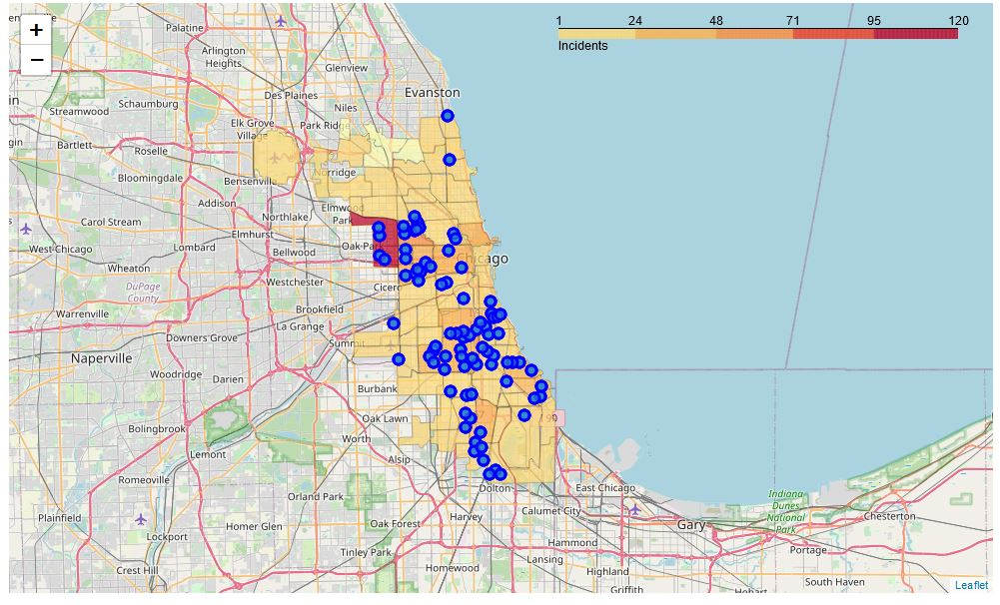

### Locations of the schools with the highest scores

In [95]:
df_es2=df_es[df_es['Labels']==2]

threshold_scale = np.linspace(df_arrest_counts_com['Number of Incidents'].min(),
                              df_arrest_counts_com['Number of Incidents'].max(),
                              6, dtype=int)

threshold_scale = threshold_scale.tolist() 
threshold_scale[-1] = threshold_scale[-1] + 1 

chicago_mapch=folium.Map(location=[latitude, longitude], zoom_start=12)

chicago_mapch.choropleth(
    geo_data=chicago_geo,
    name="choropleth",
    data=df_arrest_counts_com,
    columns=['Community area', 'Number of Incidents'],
    key_on='feature.properties.area_num_1',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Incidents'
)



chicago_mapch


for lat, lng, name in zip(df_es2['Latitude'], df_es2['Longitude'], df_es2['Name of School']):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='green',
        fill=True,
        fill_color='#219e30',
        fill_opacity=0.7,
        parse_html=False).add_to(chicago_mapch)  
    
chicago_mapch

Images of the map

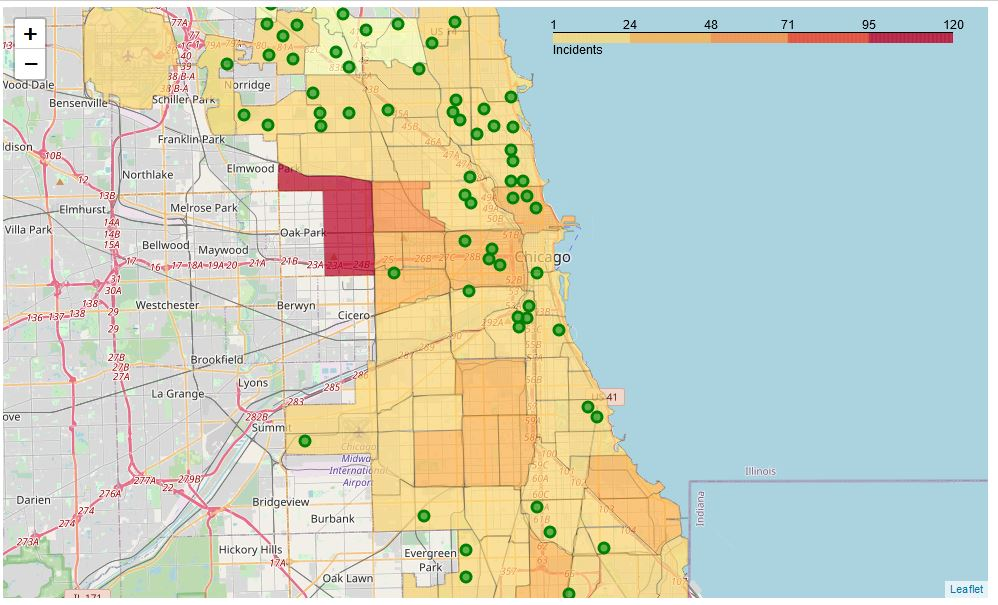

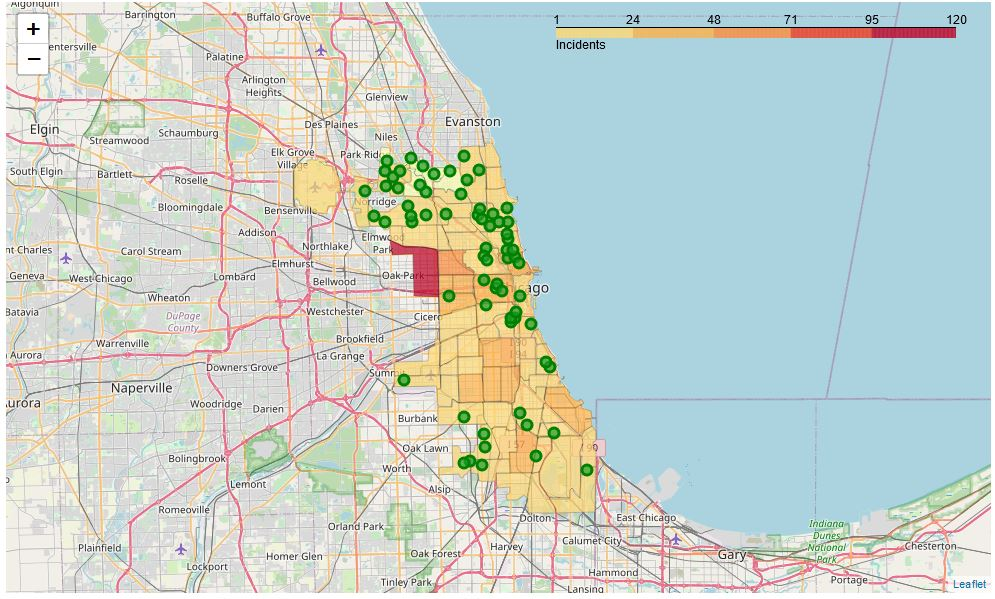